<h1 align="center"> Multimin </h1>
<h3 align="center"> Composed Multinormal Distribution Utilitie <h3>
<p align="center"><img src="https://solarsystem.nasa.gov/bosf/images/05-Geostationary%20Satellite-STILL-715x415.jpg" alt="Space orbits gif""/></p>

<h4> This package provides a tool for modeling multivariate distributions using a linear combination of normal distributions functions. It performs parameter optimization through maximum likelihood estimation, identifying the best-fitting Gaussian components for a given dataset. Once the model is fitted, users can generate new samples based on the learned distribution. This package is ideal for applications requiring probabilistic modeling of orbital elements, synthetic data generation, and multivariate statistical analysis.</h4>

Quick start

How you can use Multimin package. 

In [2]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import multimin as mm
import warnings
import pickle 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")

In [69]:
df = pd.read_csv("sbdb_query_results_NEOS.csv")
df["q"] = df["a"]*(1-df["e"])
neos = df[df["q"] < 1.30]
df

,pdes,epoch_mjd,a,e,i,om,w,ma,q
0,433,60200,1.458,0.2228,10.83,304.29,178.91,222.76,1.133158
1,719,60200,2.636,0.5470,11.58,183.85,156.23,56.29,1.194108
2,887,60200,2.472,0.5709,9.40,110.42,350.47,238.76,1.060735
3,1036,60200,2.666,0.5329,26.69,215.50,132.48,276.42,1.245289
4,1221,60200,1.919,0.4357,11.88,171.32,26.65,123.53,1.082892
...,...,...,...,...,...,...,...,...,...
34323,2024 CP5,60200,2.588,0.6057,3.48,309.59,206.24,321.35,1.020448
34324,2024 CQ5,60350,2.180,0.8506,2.16,228.85,146.50,16.09,0.325692
34325,2024 CR5,60352,1.136,0.3680,17.82,141.95,100.20,302.45,0.717952
34326,2024 CS5,60353,1.121,0.4184,42.92,140.26,168.63,222.21,0.651974


In [70]:
data_neas = np.array(df[["q","e","i"]])

In [72]:
scales=[1.30,1.00,180.0]
udata=np.zeros_like(data_neas)
for i in range(len(data_neas)):
    udata[i]=mm.Util.tIF(data_neas[i],scales,mm.Util.f2u)
udata    

array([[ 1.9157137 , -1.24942321, -2.74858407],
       [ 2.42273504,  0.18855668, -2.67718139],
       [ 1.48914664,  0.28552407, -2.89861195],
       ...,
       [ 0.2098498 , -0.54080646, -2.20838541],
       [ 0.00607263, -0.32934501, -1.16122678],
       [ 1.01446988,  0.67132596, -3.62331477]])

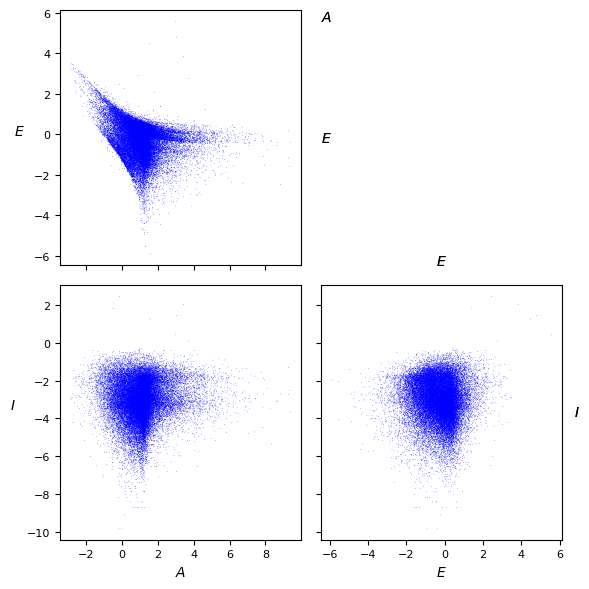

In [73]:
properties=dict(
    Q=dict(label=r"$A$",range=None),
    E=dict(label=r"$E$",range=None),
    I=dict(label=r"$I$",range=None),
)
G=mm.PlotGrid(properties,figsize=3)

sargs=dict(s=0.2,edgecolor='None',color='b')
hist=G.scatterPlot(udata,**sargs)

In [92]:
original_q = data_neas[:,0]
original_e = data_neas[:,1]
original_i = data_neas[:,2]

u_q = udata[:,0]
u_e = udata[:,1]
u_i = udata[:,2]

fig = go.Figure()

# NEOS
fig.add_trace(go.Splom(
    dimensions=[
        dict(label='q [au]', values=original_q),
        dict(label='e', values=original_e),
        dict(label='i [°]', values=original_i)
    ],
    showupperhalf=False,
    diagonal_visible=False,
    marker=dict(color="#6baed6", size=3)
))

# Layout minimalista
fig.update_layout(
    title='Original Distribution',
    title_x=0.5,
    width=650,
    height=650,
    font=dict(family="Arial", color="#444444", size=14),
    plot_bgcolor='white',
    paper_bgcolor='white',
    dragmode='select',
    hovermode='closest',
    legend=dict(
        x=0.8, y=1.05,
        bgcolor='rgba(0,0,0,0)',
        borderwidth=0
    )
)

# Ajuste de ejes para estilo limpio
for axis in ['xaxis', 'xaxis2', 'xaxis3', 'yaxis', 'yaxis2', 'yaxis3']:
    fig.update_layout({axis: dict(
        showline=True,
        linewidth=1,
        linecolor="#333333",
        mirror=True,
        showgrid=True,
        gridcolor="#e6e6e6",
        zeroline=False
    )})

fig.show()


In [ ]:
#fig.write_html('original_qei.html') 

In [90]:
fig1 = go.Figure()

# NEOS
fig1.add_trace(go.Splom(
    dimensions=[
        dict(label='Q [au]', values=u_q),
        dict(label='E', values=u_e),
        dict(label='I [°]', values=u_i)
    ],
    showupperhalf=False,
    diagonal_visible=False,
    marker=dict(color="#ED5C5E", size=3, opacity=0.8)
))

# Layout minimalista
fig1.update_layout(
    title='Unbounded distribution',
    title_x=0.5,
    width=650,
    height=650,
    font=dict(family="Arial", color="#444444", size=14),
    plot_bgcolor='white',
    paper_bgcolor='white',
    dragmode='select',
    hovermode='closest',
    legend=dict(
        x=0.8, y=1.05,
        bgcolor='rgba(0,0,0,0)',
        borderwidth=0
    )
)

# Ajuste de ejes para estilo limpio
for axis in ['xaxis', 'xaxis2', 'xaxis3', 'yaxis', 'yaxis2', 'yaxis3']:
    fig1.update_layout({axis: dict(
        showline=True,
        linewidth=1,
        linecolor="#333333",
        mirror=True,
        showgrid=True,
        gridcolor="#e6e6e6",
        zeroline=False
    )})

fig1.show()

In [ ]:
#fig1.write_html('unbounded_qei.html') 

In [7]:
F=mm.FitCMND(Ngauss=1,Nvars=3)
print(F.cmnd)

Composition of Ngauss = 1 gaussian multivariates of Nvars = 3 random variables:
    Weights: [1.0]
    Number of variables: 3
    Averages (μ): [[0, 0, 0]]
    Standard deviations (σ): [[1.0, 1.0, 1.0]]
    Correlation coefficients (ρ): [[0.0, 0.0, 0.0]]

    Covariant matrices (Σ): 
        [[[1.0, 0.0, 0.0], [0.0, 1.0, 0.0], [0.0, 0.0, 1.0]]]
    Flatten parameters: 
        With covariance matrix (10):
            [p1,μ1_1,μ1_2,μ1_3,Σ1_11,Σ1_12,Σ1_13,Σ1_22,Σ1_23,Σ1_33]
            [1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0]
        With std. and correlations (10):
            [p1,μ1_1,μ1_2,μ1_3,σ1_1,σ1_2,σ1_3,ρ1_12,ρ1_13,ρ1_23]
            [1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0]


In [8]:
t = mm.Util.elTime(0)
F.fitData(udata,verbose=False,advance=1)
t = mm.Util.elTime()
print(f"-log(L)/N = {F.solution.fun/len(udata)}")

Iterations:
Iter 0:
	Vars: [2.9, 1.4, -1.5, -1, -1.1, -1.5, 3, 1.2, 1.6]
	LogL/N: 5.384733895771078
Iter 1:
	Vars: [3.1, 1.2, -2, -1, -1.2, -1.7, 2.9, 1.4, 1.6]
	LogL/N: 5.203383283601684
Iter 2:
	Vars: [3, 0.92, -2.3, -1, -1.3, -1.8, 3, 1.5, 1.5]
	LogL/N: 5.093541007285479
Iter 3:
	Vars: [2.6, 0.18, -2.7, -1.1, -1.7, -1.9, 3, 1.4, 1.3]
	LogL/N: 4.879765625669055
Iter 4:
	Vars: [2.2, -0.072, -2.8, -1.2, -1.8, -1.9, 2.7, 1.2, 1.2]
	LogL/N: 4.729039168602765
Iter 5:
	Vars: [0.87, -0.87, -3, -1.8, -2.2, -2, 1.5, 0.31, 0.54]
	LogL/N: 4.278642291442656
Iter 6:
	Vars: [0.99, -0.82, -3, -1.9, -2.3, -2.1, 1.3, 0.095, 0.31]
	LogL/N: 4.214732896450778
Iter 7:
	Vars: [1.1, -0.71, -3, -2, -2.4, -2.1, 0.97, -0.16, -0.042]
	LogL/N: 4.156085295154432
Iter 8:
	Vars: [1.1, -0.68, -3, -2, -2.4, -2.1, 0.99, -0.15, -0.035]
	LogL/N: 4.153299157062071
Iter 9:
	Vars: [1.1, -0.65, -3, -2, -2.4, -2.1, 1, -0.14, -0.038]
	LogL/N: 4.1521446821767825
Iter 10:
	Vars: [1.1, -0.65, -3, -2, -2.4, -2.1, 1, -0.14, -0.03

In [9]:
print(F.cmnd)

Composition of Ngauss = 1 gaussian multivariates of Nvars = 3 random variables:
    Weights: [1.0]
    Number of variables: 3
    Averages (μ): [[1.132376091253126, -0.6453961926987936, -2.987398409062173]]
    Standard deviations (σ): [[1.1475576668368654, 0.8146251297568786, 1.0881063522314387]]
    Correlation coefficients (ρ): [[0.4615970269081824, -0.0710161605910048, -0.01876894832895093]]

    Covariant matrices (Σ): 
        [[[1.3168885987160703, 0.43151443166304054, -0.08867537902635501], [0.43151443166304054, 0.6636141020314114, -0.016636772870180984], [-0.08867537902635501, -0.016636772870180984, 1.1839754337664077]]]
    Flatten parameters: 
        With covariance matrix (10):
            [p1,μ1_1,μ1_2,μ1_3,Σ1_11,Σ1_12,Σ1_13,Σ1_22,Σ1_23,Σ1_33]
            [1.0, 1.132376091253126, -0.6453961926987936, -2.987398409062173, 1.3168885987160703, 0.43151443166304054, -0.08867537902635501, 0.6636141020314114, -0.016636772870180984, 1.1839754337664077]
        With std. and correl

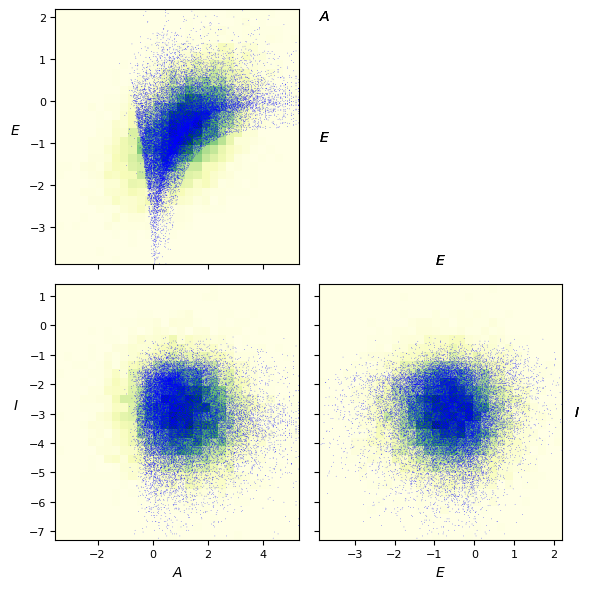

In [10]:
props=["A","E","I"]
hargs=dict(bins=30,cmap='YlGn')
sargs=dict(s=0.2,edgecolor='None',color='b')
G=F.plotFit(props=props,hargs=hargs,sargs=sargs,figsize=3)

In [11]:
Ngauss = 1
Nvars = 3
F.saveFit(f"products/fit-NEOS-Ngauss{Ngauss}-Nvars{Nvars}.pkl",useprefix=False)

In [13]:
Ngauss = 1
Nvars = 3
F = mm.FitCMND(f"products/fit-NEOS-Ngauss{Ngauss}-Nvars{Nvars}.pkl")
F

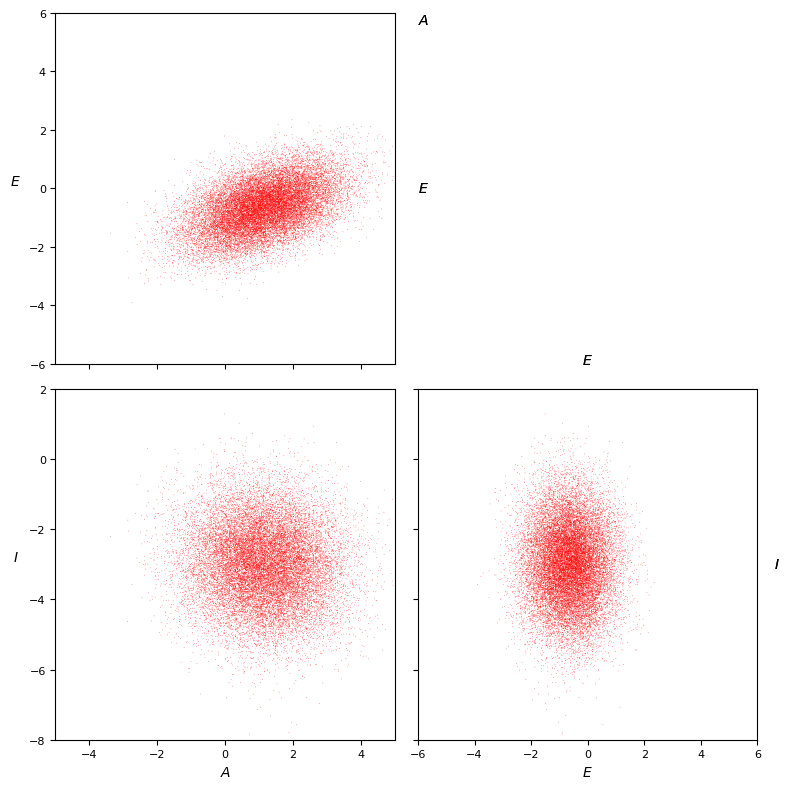

In [14]:
F.cmnd.plotSample(N=len(F.data),
                  figsize=4,
                  props=["A","E","I"],ranges=[[-5,5],[-6,6],[-8,2]],
                  sargs=dict(s=0.2,edgecolor='None',color='r'))

In [15]:
fit_sample = F.cmnd.rvs(Nsam=len(F.data))

In [16]:
A = fit_sample[:,0]
E = fit_sample[:,1]
I = fit_sample[:,2]

In [17]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='A',
                                 values=A),
                            dict(label='E',
                                 values=E),
                            dict(label='I',
                                 values=I)],
                showupperhalf=False, # remove plots on diagonal
                diagonal_visible=False,
                opacity=0.5,
                marker=dict(showscale=False, # colors encode categorical variables
                            color='blue', size=0.7)
                ))


fig.update_layout(
    width=600,
    height=600
)

fig.show()

$$ A = \log({\frac{a/a_{max}}{1-a/a_{max}}})$$
$$ E = \log({\frac{e/e_{max}}{1-e/e_{max}}})$$
$$ I = \log({\frac{i/i_{max}}{1-i/i_{max}}})$$


$$ a = {\frac{10^A a_{max}}{10^A + 1}}$$
$$ e = {\frac{10^E e_{max}}{10^E + 1}}$$
$$ i = {\frac{10^I i_{max}}{10^I + 1}}$$

In [14]:
scales = [2.00,1.00,180.0]
a = (scales[0]*10**A)/(10**A + 1)
e = (scales[1]*10**E)/(10**E + 1)
i = (scales[2]*10**I)/(10**I + 1)

mm.Util.tIF(udata[0],scales,mm.Util.u2f)

# a e i om om m 
porque m y no f?

viridis color blind friendly

In [15]:
fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='a',
                                 values=a),
                            dict(label='e',
                                 values=e),
                            dict(label='i',
                                 values=i)],
                showupperhalf=False, # remove plots on diagonal
                diagonal_visible=False,
                opacity=0.5,
                marker=dict(showscale=False, # colors encode categorical variables
                            color='blue', size=0.7)
                ))


fig.update_layout(
    width=600,
    height=600
)

fig.show()

In [10]:
Ngauss = 100
Nvars = 3
F=mm.FitCMND(Ngauss=Ngauss,Nvars=Nvars)
print(F.cmnd)

Composition of Ngauss = 100 gaussian multivariates of Nvars = 3 random variables:
    Weights: [0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.009999999999999993, 0.

In [11]:
t = mm.Util.elTime(0)
F.fitData(udata,verbose=False,advance=1)
t = mm.Util.elTime()
print(f"-log(L)/N = {F.solution.fun/len(udata)}")
F.saveFit(f"products/fit-NEOS-Ngauss{Ngauss}-Nvars{Nvars}.pkl",useprefix=False)

Iterations:
Iter 0:
	Vars: [-0.31, 1.3, 0.43, 0.065, 0.43, -0.61, 1, 0.01, 0.01, 0.01, 0.01, 0.01, 1.6, 0.38, 0.007, 0.011, 0.01, 0.39, 1, 0.14, 0.017, 0.011, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.017, 0.01, 0.069, 0.63, -0.00031, 0.01, -0.085, 0.76, -1.1, 2.5, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 3.1, 1.5, -1.7, 3.1, 1.5, -1.7, 3.1, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.5, -1.7, 3, 1.4, -1.7, 3, 1.4, -1.7, 3, 1.4, -1.7, 3, 1.4, -1.7, 3, 1.4, -1.7, 3, 1.4, -1.6, 3, 1.4, -1.6, 3, 1.4, -1.6, 3, 1.4, -1.6, 3, 1.4, -1.6, 3, 1.4, -1.6, 3, 1.4, -1.6, 3, 1.4, -1

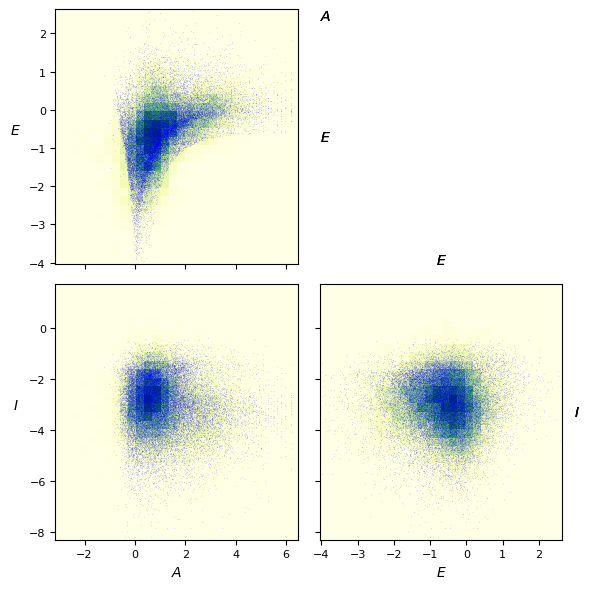

In [20]:
props=["A","E","I"]
hargs=dict(bins=30,cmap='YlGn')
sargs=dict(s=0.1,edgecolor='None',color='b')
G=F.plotFit(props=props,hargs=hargs,sargs=sargs,figsize=3)

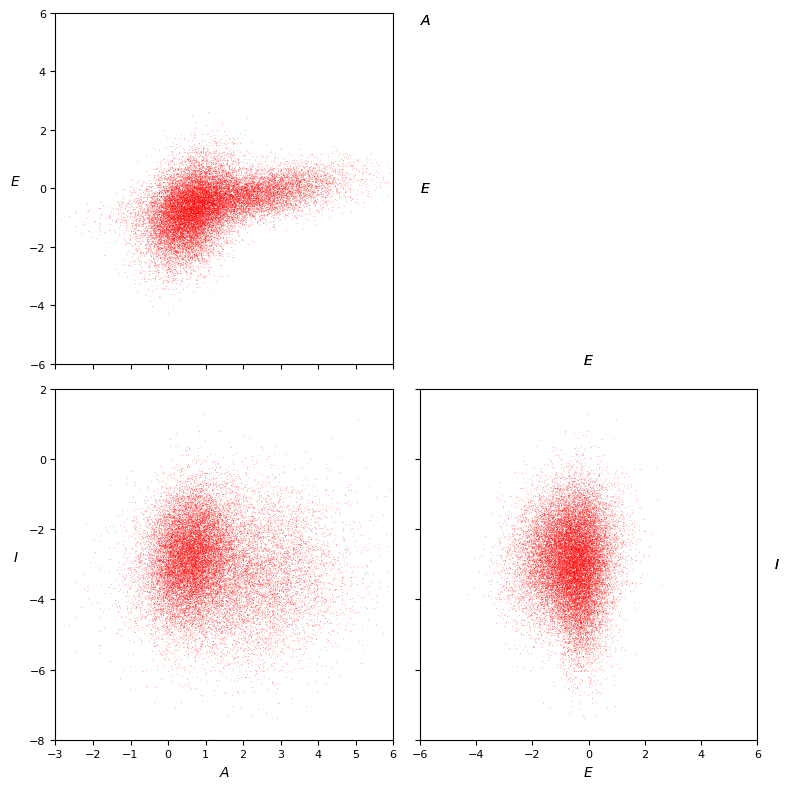

In [ ]:
Ngauss = 2
Nvars = 3
F = mm.FitCMND(f"products/fit-NEOS-Ngauss{Ngauss}-Nvars{Nvars}.pkl")

F.cmnd.plotSample(N=len(F.data),
                  figsize=4,
                  props=["A","E","I"],ranges=[[-3,6],[-6,6],[-8,2]],
                  sargs=dict(s=0.2,edgecolor='None',color='r'))

In [24]:
fit_sample = F.cmnd.rvs(Nsam=len(F.data))
A = fit_sample[:,0]
E = fit_sample[:,1]
I = fit_sample[:,2]

fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='A',
                                 values=A),
                            dict(label='E',
                                 values=E),
                            dict(label='I',
                                 values=I)],
                showupperhalf=False, # remove plots on diagonal
                diagonal_visible=False,
                opacity=0.5,
                marker=dict(showscale=False, # colors encode categorical variables
                            color='blue', size=0.7)
                ))


fig.update_layout(
    width=600,
    height=600
)

fig.show()

In [ ]:
scales = [2.00,1.00,180.0]
a = (scales[0]*10**A)/(10**A + 1)
e = (scales[1]*10**E)/(10**E + 1)
i = (scales[2]*10**I)/(10**I + 1)

mm.Util.tIF(udata[0],scales,mm.Util.u2f)

In [18]:
## documentacion de clases y metodos con readocs 
## 

In [19]:
colors_map = ['Blues', 'OrRd', 'YlGn']
colors_points = ['coral', 'forestgreen', 'royalblue']
color_map  = np.random.choice(colors_map )
color_points = np.random.choice(colors_points)

### NEOS con q

In [34]:
neos_db = pd.read_csv('neo_db.csv.gz', index_col=0, compression='gzip',low_memory=False)
#nea_db = neos_db[neos_db['kind'].isin(['an','au'])]
#data_neas = nea_db[["q","e","i"]].values

In [35]:
neos_db

,pdes,full_name,kind,class,H,G,BV,UB,IR,spec_T,...,albedo,diameter,extent,diameter_sigma,GM,density,rot_per,A1,A2,A3
spkid,,,,,,,,,,,,,,,,,,,,,
20000433,433,433 Eros (A898 PA),an,AMO,10.41,0.46,0.921,0.531,NaN,S,...,0.250,16.840,34.4x11.2x11.2,0.06,0.000446,2.67,5.270,NaN,NaN,NaN
20000719,719,719 Albert (A911 TB),an,AMO,15.59,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.801,NaN,NaN,NaN
20000887,887,887 Alinda (A918 AA),an,AMO,13.80,-0.12,0.832,0.436,NaN,S,...,0.310,4.200,NaN,NaN,NaN,NaN,28.410,NaN,NaN,NaN
20001036,1036,1036 Ganymed (A924 UB),an,AMO,9.18,0.30,0.842,0.417,NaN,S,...,0.238,37.675,NaN,0.40,NaN,NaN,10.297,NaN,NaN,NaN
20001221,1221,1221 Amor (1932 EA1),an,AMO,17.37,NaN,NaN,NaN,NaN,NaN,...,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,-7.200000e-15,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003804,2021 Q5,P/2021 Q5 (ATLAS),cu,JFc,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1003914,2023 E1,C/2023 E1 (ATLAS),cu,HTC,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.400000e-09,-3.000000e-10,2.100000e-09
1003954,2023 S3,C/2023 S3 (Lemmon),cu,HTC,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
import plotly.graph_objects as go

q = data_neas[:, 0]
e = data_neas[:, 1]
i = data_neas[:, 2]

# Paleta de colores personalizada tipo fuego
colorscale = [
    [0.0, 'rgb(255,255,178)'],  # amarillo
    [0.5, 'rgb(253,141,60)'],   # naranja
    [1.0, 'rgb(240,59,32)']     # rojo intenso
]

fig = go.Figure(data=go.Splom(
    dimensions=[
        dict(label='q', values=q),
        dict(label='e', values=e),
        dict(label='i', values=i)
    ],
    showupperhalf=False,
    diagonal_visible=False,
    opacity=0.8,
    marker=dict(
        color=q,  # El color varía según "q"
        colorscale=colorscale,
        size=2,
        showscale=True,
        colorbar=dict(title='q')  # Barra de color con etiqueta
    )
))

fig.update_layout(
    width=700,
    height=700,
    template='plotly_dark',
)

fig.show()


In [13]:
fig.write_html("NEOS.html")

In [4]:
scales=[1.35,1.00,180.0]
udata=np.zeros_like(data_neas)
for i in range(len(data_neas)):
    udata[i]=mm.Util.tIF(data_neas[i],scales,mm.Util.f2u)
udata 

array([[ 1.65272691, -1.2500008 , -2.74858407],
       [ 2.04247635,  0.18734605, -2.67810469],
       [ 1.30054045,  0.2867488 , -2.89861195],
       ...,
       [ 0.80531898, -1.52995684, -2.57733975],
       [ 0.95920679, -0.09246583, -3.54715129],
       [ 0.87924946,  0.67087921, -3.62331477]])

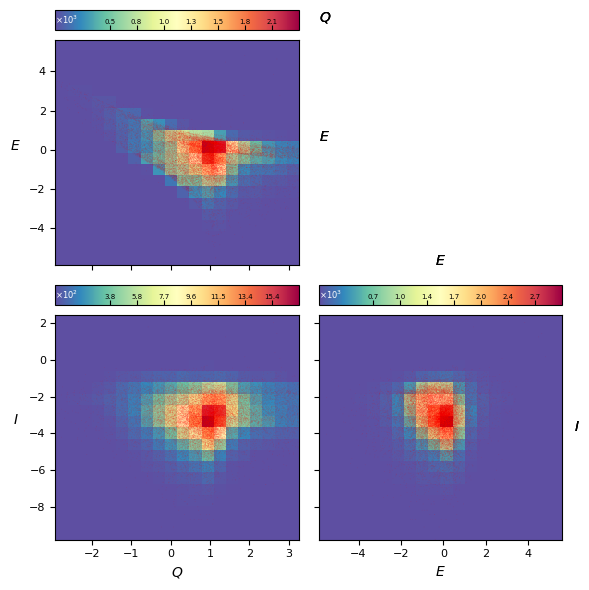

In [9]:
properties=dict(
    Q=dict(label=r"$Q$",range=None),
    E=dict(label=r"$E$",range=None),
    I=dict(label=r"$I$",range=None),
)
G=mm.PlotGrid(properties,figsize=3)

hargs=dict(bins=20,cmap='Spectral_r')
hist=G.plotHist(udata,colorbar=True,**hargs)

sargs=dict(s=0.2,edgecolor='None',color='r', alpha=0.2)
hist=G.scatterPlot(udata,**sargs)


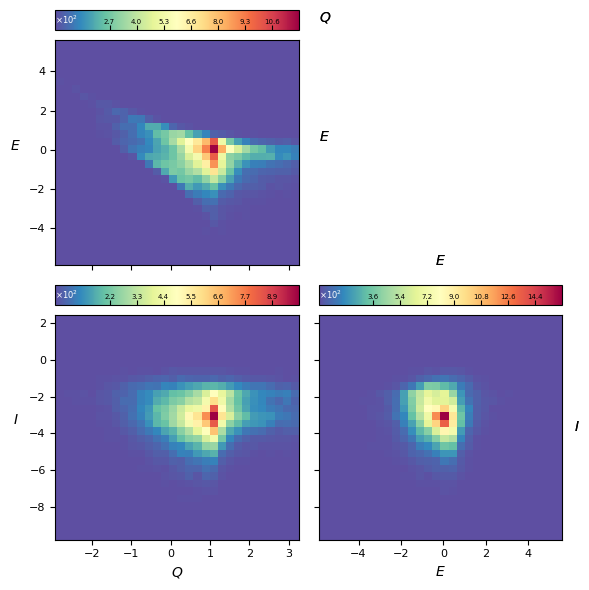

In [10]:
G=mm.PlotGrid(properties,figsize=3)
hargs=dict(bins=30,cmap='Spectral_r')
hist=G.plotHist(udata,colorbar=True,**hargs)

In [11]:
F=mm.FitCMND(Ngauss=10,Nvars=3)
print(F.cmnd)

Composition of Ngauss = 10 gaussian multivariates of Nvars = 3 random variables:
    Weights: [0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002, 0.10000000000000002]
    Number of variables: 3
    Averages (μ): [[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0]]
    Standard deviations (σ): [[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0, 1.0]]
    Correlation coefficients (ρ): [[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0]]

    Covariant matrices (Σ): 
        [[[1.0, 0.0, 0.0], [0.0, 1.0, 0.0], [0.0, 0.0, 1.0]], [[1.0, 0.0, 0.0], [0.0, 1.0, 0.0], [0.0, 0

In [12]:
t = mm.Util.elTime(0)
F.fitData(udata,verbose=False,advance=1)
t = mm.Util.elTime()
print(f"-log(L)/N = {F.solution.fun/len(udata)}")

Iterations:
Iter 0:
	Vars: [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 2.6, 1.8, -1.7, 2.6, 1.8, -1.7, 2.6, 1.7, -1.7, 2.6, 1.7, -1.7, 2.6, 1.7, -1.7, 2.6, 1.7, -1.7, 2.6, 1.7, -1.6, 2.6, 1.7, -1.6, 2.6, 1.7, -1.6, 2.5, 1.7, -1.6, -1.3, -1.2, -1.8, -1.3, -1.2, -1.7, -1.4, -1.3, -1.7, -1.4, -1.3, -1.6, -1.4, -1.3, -1.6, -1.4, -1.3, -1.5, -1.4, -1.3, -1.6, -1.4, -1.3, -1.5, -1.4, -1.3, -1.4, -1.4, -1.3, -1.3, 4.1, 1.7, 1.8, 3.1, 2.1, 2.1, 2.6, 2.4, 2.1, 2.3, 2.5, 2, 2, 2.1, 1.9, 1.8, 1.8, 1.9, 1.5, 1.6, 1.8, 1.6, 1.7, 1.7, 1.6, 1.6, 1.7, 2, 1.7, 1.7]
	LogL/N: 5.387082624225197
Iter 1:
	Vars: [-4.5, 0.13, -0.016, -0.29, -2, -2.5, -0.19, -0.54, 0.075, 0.8, -1.4, 2.3, -2.1, 2.7, 0.44, -2, 2, 0.42, -2.5, 1.3, 0.3, -2.5, 0.0025, 0.97, -2.1, 0.18, 0.55, -2.7, 1.3, 0.25, -2.9, 1.2, 0.16, -2.9, 1.4, 0.26, -2.8, 1.8, 0.52, -2.7, -2.8, -2.3, -2.2, -1.3, -2.6, -1.8, -1.9, -2.2, -2, -3.2, -1.7, -1.7, -2.6, -2.8, -1.8, -3.5, -3.5, -2, -2.8, -3.4, -1.8, -2.7, -1.5, -1.9, -1.4, -1.4, -1.8, -1.7,

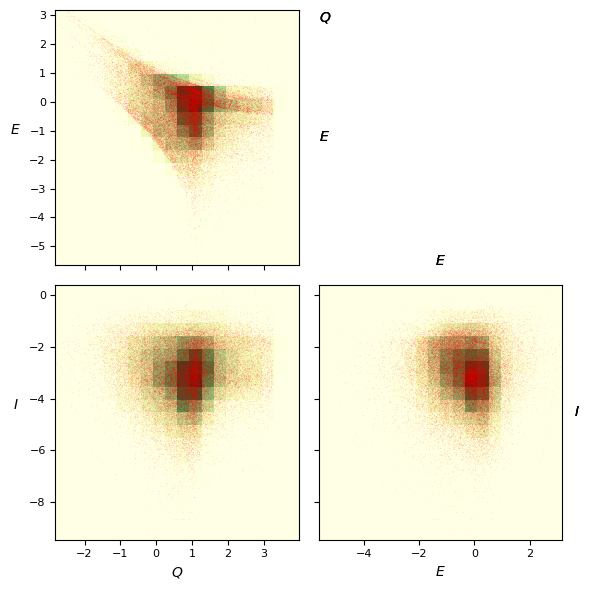

In [13]:
props=["Q","E","I"]
hargs=dict(bins=20,cmap='YlGn')
sargs=dict(s=0.2,edgecolor='None',color='r', alpha=0.3)
G=F.plotFit(props=props,hargs=hargs,sargs=sargs,figsize=3)

plot ajuste con plot neos original

In [49]:
Ngauss = 10 
F = mm.FitCMND(f"products/fit-NEOS-Ngauss{Ngauss}2.pkl")

In [50]:
F

In [51]:
fit_sample =F.cmnd.rvs(Nsam=10000)
data_neas_plot = data_neas[:500]

scales=[1.35,1.00,180.0]
converted_sample = np.zeros_like(fit_sample)
for i, element in enumerate(fit_sample):
    converted_sample[i] = mm.Util.tIF(element, scales, mm.Util.u2f)

In [52]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Dataset base (para el histograma de fondo)
q_ajuste = converted_sample[:,0]
e_ajuste = converted_sample[:,1]
i_ajuste = converted_sample[:,2]

# Segundo dataset para overlay scatter
q = data_neas_plot[:,0]
e = data_neas_plot[:,1]
i = data_neas_plot[:,2]

# Crear subplot grid 3x3
fig = make_subplots(rows=3, cols=3,
                    shared_xaxes=True,
                    shared_yaxes=True,
                    horizontal_spacing=0.06,
                    vertical_spacing=0.06)

# Variables y sus índices
vars_data = {'q [AU]': (q_ajuste, q), 'e': (e_ajuste, e), 'i [deg]': (i_ajuste, i)}
vars_list = list(vars_data.keys())

# Paleta de colores cálidos
colorscale = [
    [0, 'rgb(255,255,178)'],
    [0.5, 'rgb(253,141,60)'],
    [1, 'rgb(240,59,32)']
]

# Rellenar los subplots con histogramas 2D y scatter
for i in range(3):
    for j in range(i):  # Solo llenamos la mitad inferior
        xname = vars_list[j]
        yname = vars_list[i]
        x1, x2 = vars_data[xname]
        y1, y2 = vars_data[yname]

        # Contour Density Plot
        fig.add_trace(
            go.Histogram2dContour(
                x=x1,
                y=y1,
                colorscale=colorscale,
                showscale=False,
                contours=dict(showlines=False),
                opacity=0.8
            ),
            row=i+1, col=j+1
        )

        # Overlay de puntos pequeños
        fig.add_trace(
            go.Scattergl(
                x=x2,
                y=y2,
                mode='markers',
                marker=dict(color='white', size=2, opacity=0.8),
                showlegend=False
            ),
            row=i+1, col=j+1
        )

        # Agregar labels a los ejes
        fig.update_xaxes(title_text=xname, row=i+1, col=j+1)
        fig.update_yaxes(title_text=yname, row=i+1, col=j+1)

# Estética del gráfico
fig.update_layout(
    template='plotly_dark',
    width=700,
    height=700,
    margin=dict(t=10, l=10, b=10, r=10)
)

# Ocultar los espacios en la parte superior y la diagonal
for i in range(3):
    for j in range(3):
        if j >= i:
            fig.update_xaxes(visible=False, row=i+1, col=j+1)
            fig.update_yaxes(visible=False, row=i+1, col=j+1)

fig.show()



In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Dataset base
q_ajuste = converted_sample[:, 0]
e_ajuste = converted_sample[:, 1]
i_ajuste = converted_sample[:, 2]

q = data_neas_plot[:, 0]
e = data_neas_plot[:, 1]
i = data_neas_plot[:, 2]

fig = make_subplots(
    rows=3, cols=3,
    shared_xaxes=True,
    shared_yaxes=True,
    horizontal_spacing=0.06,
    vertical_spacing=0.06
)

# Variables y sus índices
vars_data = {'q [AU]': (q_ajuste, q), 'e': (e_ajuste, e), 'i [°]': (i_ajuste, i)}
vars_list = list(vars_data.keys())

# Paleta refinada
colorscale = [
    [0.0, 'rgb(230,245,255)'],
    [0.3, 'rgb(171,217,233)'],
    [0.6, 'rgb(69,117,180)'],
    [1.0, 'rgb(8,48,107)']
]
# Añadir histogramas de densidad y puntos
for i in range(3):
    for j in range(i):
        xname = vars_list[j]
        yname = vars_list[i]
        x1, x2 = vars_data[xname]
        y1, y2 = vars_data[yname]

        # Reemplazar en la parte del contour:
        fig.add_trace(
            go.Histogram2dContour(
                x=x1,
                y=y1,
                colorscale=colorscale,
                showscale=False,
                contours=dict(showlines=False),
                opacity=1  # opacidad al máximo para que se note bien
            ),
            row=i+1, col=j+1
        )

        fig.add_trace(
            go.Scattergl(
                x=x2,
                y=y2,
                mode='markers',
                marker=dict(color='black', size=2, opacity=0.5),
                showlegend=False
            ),
            row=i+1, col=j+1
        )

        # Etiquetas
        fig.update_xaxes(title_text=xname, row=i+1, col=j+1)
        fig.update_yaxes(title_text=yname, row=i+1, col=j+1)

# Estilo limpio y profesional
fig.update_layout(
    width=700,
    height=700,
    plot_bgcolor='white',
    paper_bgcolor='white',
    font=dict(family="Arial", size=13, color='black'),
    margin=dict(t=20, l=20, b=20, r=20)
)

# Ajustar ejes (líneas finas, sin grillas pesadas)
for i in range(1, 4):
    for j in range(1, 4):
        fig.update_xaxes(
            row=i, col=j,
            showline=True,
            linewidth=1,
            linecolor='black',
            mirror=True,
            zeroline=False,
            gridcolor='#eaeaea'
        )
        fig.update_yaxes(
            row=i, col=j,
            showline=True,
            linewidth=1,
            linecolor='black',
            mirror=True,
            zeroline=False,
            gridcolor='#eaeaea'
        )

# Ocultar ejes innecesarios en la diagonal y parte superior
for i in range(3):
    for j in range(3):
        if j >= i:
            fig.update_xaxes(visible=False, row=i+1, col=j+1)
            fig.update_yaxes(visible=False, row=i+1, col=j+1)

fig.show()


NameError: name 'converted_sample' is not defined

In [5]:
q = converted_sample[:,0]
e = converted_sample[:,1]
i = converted_sample[:,2]

w = np.random.uniform(0, 360, len(fit_sample))
om = np.random.uniform(0, 360, len(fit_sample))
ma = np.random.uniform(0, 360, len(fit_sample))

orbital_elements = np.zeros((len(fit_sample), 6))
orbital_elements[:,0] = q
orbital_elements[:,1] = e
orbital_elements[:,2] = i
orbital_elements[:,3] = om
orbital_elements[:,4] = w
orbital_elements[:,5] = ma

In [6]:
import plotly.graph_objects as go
import numpy as np

# Supongo que ya tienes q, e, i, om, w, ma definidos como arrays
# Asegúrate que todos tengan la misma longitud

# Paleta de colores cálidos en valores RGB
colorscale = [
    [0.0, 'rgb(255,255,178)'],
    [0.5, 'rgb(253,141,60)'],
    [1.0, 'rgb(240,59,32)']
]

# Para usar la paleta, necesitamos un array de valores numéricos para mapear color
# Aquí usamos una variable como base del color, por ejemplo `e`
color_array = e  # o cualquier otra variable que quieras usar para color

fig = go.Figure(data=go.Splom(
    dimensions=[
        dict(label='q [AU]', values=q),
        dict(label='e', values=e),
        dict(label='i [deg]', values=i),
        dict(label='Ω [deg]', values=om),
        dict(label='ω [deg]', values=w),
        dict(label='M [deg]', values=ma)
    ],
    showupperhalf=False,
    diagonal_visible=False,
    opacity=0.6,
    marker=dict(
        showscale=False,
        color=color_array,
        colorscale=colorscale,
        size=2,
        line=dict(width=0.2, color='rgba(200,200,200,0.2)')
    )
))

fig.update_layout(
    template='plotly_dark',
    width=800,
    height=800,
    dragmode='select',
    hovermode='closest'
)

fig.show()


In [17]:
q = converted_sample[:, 0]
e = converted_sample[:, 1]
i = converted_sample[:, 2]

w = np.random.uniform(0, 360, len(fit_sample))
om = np.random.uniform(0, 360, len(fit_sample))
ma = np.random.uniform(0, 360, len(fit_sample))


# Definimos la paleta azul minimalista
colorscale_azul = [
    [0.0, 'rgb(220,230,255)'],
    [0.5, 'rgb(100,149,237)'],   # cornflowerblue
    [1.0, 'rgb(25,25,112)']      # midnightblue
]

fig = go.Figure(data=go.Splom(
    dimensions=[
        dict(label='q [AU]', values=q),
        dict(label='e', values=e),
        dict(label='i [°]', values=i),
        dict(label='Ω [°]', values=om),
        dict(label='ω [°]', values=w),
        dict(label='M [°]', values=ma)
    ],
    showupperhalf=False,
    diagonal_visible=False,
    opacity=0.6,
    marker=dict(
        color=e,
        colorscale=colorscale_azul,
        size=2,
        line=dict(width=0.1, color='rgba(180,180,180,0.3)'),
        showscale=False
    )
))

# Estética minimalista
fig.update_layout(
    template='none',
    width=600,
    height=600,
    font=dict(family='Helvetica', size=12, color='black'),
    margin=dict(t=30, l=40, b=40, r=30),
    dragmode='select',
    hovermode='closest',
    plot_bgcolor='white',
    paper_bgcolor='white'
)

# Ejes con líneas grises claras
fig.update_xaxes(showgrid=True, gridcolor='lightgray', zeroline=False)
fig.update_yaxes(showgrid=True, gridcolor='lightgray', zeroline=False)

fig.show()


In [ ]:
#fig.write_image("density_cornerplot_neos_ajustado.png", scale=5)

In [ ]:
#fig.write_html("density_cornerplot_neos_ajustado.html")

In [58]:
path_data = "sbdb_query_results_NEOS.csv"

neos = pd.read_csv(path_data)
neos["q"]=neos["a"]*(1-neos["e"])
neos = neos[neos["q"] < 1.30]

In [59]:
neos

,pdes,epoch_mjd,a,e,i,om,w,ma,q
0,433,60200,1.458,0.2228,10.83,304.29,178.91,222.76,1.133158
1,719,60200,2.636,0.5470,11.58,183.85,156.23,56.29,1.194108
2,887,60200,2.472,0.5709,9.40,110.42,350.47,238.76,1.060735
3,1036,60200,2.666,0.5329,26.69,215.50,132.48,276.42,1.245289
4,1221,60200,1.919,0.4357,11.88,171.32,26.65,123.53,1.082892
...,...,...,...,...,...,...,...,...,...
34323,2024 CP5,60200,2.588,0.6057,3.48,309.59,206.24,321.35,1.020448
34324,2024 CQ5,60350,2.180,0.8506,2.16,228.85,146.50,16.09,0.325692
34325,2024 CR5,60352,1.136,0.3680,17.82,141.95,100.20,302.45,0.717952
34326,2024 CS5,60353,1.121,0.4184,42.92,140.26,168.63,222.21,0.651974


In [60]:
data_neas = np.array(neos[["q","e","i"]])

scales=[1.30,1.00,180.0]
udata=np.zeros_like(data_neas)
print("Trasforming data...")
for i in range(len(data_neas)):
    udata[i]=mm.Util.tIF(data_neas[i],scales,mm.Util.f2u)

Trasforming data...


In [46]:
udata

array([[ 1.9157137 , -1.24942321, -2.74858407],
       [ 2.42273504,  0.18855668, -2.67718139],
       [ 1.48914664,  0.28552407, -2.89861195],
       ...,
       [ 0.2098498 , -0.54080646, -2.20838541],
       [ 0.00607263, -0.32934501, -1.16122678],
       [ 1.01446988,  0.67132596, -3.62331477]])

In [47]:
print("Iniciando ajuste...")
Ngauss = 3
Nvars = 3
F=mm.FitCMND(Ngauss=Ngauss,Nvars=Nvars)

Iniciando ajuste...


In [48]:
t = mm.Util.elTime(0)
print("Execution time: ", t)

F.fitData(udata,verbose=False,advance=1)
t = mm.Util.elTime()
print("Execution time: ", t)

Execution time:  (221.82044959068298, [3.6970074931780497, 'min'])
Iterations:
Iter 0:
	Vars: [0.33, 0.33, 0.33, 2.8, 1.8, -1.7, 2.8, 1.7, -1.6, 2.7, 1.7, -1.6, -1.2, -1.2, -1.7, -1.3, -1.2, -1.6, -1.2, -1.2, -1.4, 3.2, 1.7, 1.9, 1.5, 1.9, 1.9, 1.5, 1.5, 1.7]
	LogL/N: 5.542147250088009
Iter 1:
	Vars: [0.11, 0.31, 0.35, 2.9, 1.1, -2.3, 2, 0.58, -2.3, 2, 0.8, -2.5, -1.2, -1.6, -1.9, -1.9, -1.7, -1.9, -1.2, -1.5, -1.4, 2.1, 1.4, 0.9, 2.1, 1.9, 1.3, 1.1, 1.1, 1.5]
	LogL/N: 5.087806204462077
Iter 2:
	Vars: [-72, 2.5, 0.35, 2.9, 1.1, -2.3, 1.8, 0.085, -2.5, 1.3, 0.26, -2.8, -1.2, -1.6, -1.9, -1.9, -2.1, -1.9, -1.5, -1.7, -1.6, 2.1, 1.4, 0.9, 1.5, 1.4, 0.73, 0.53, 0.72, 0.95]
	LogL/N: 4.673339730404194
Iter 3:
	Vars: [-72, 47, 0.12, 2.9, 1.1, -2.3, 1.5, -0.24, -2.8, 0.89, -0.031, -3, -1.2, -1.6, -1.9, -2.2, -2.4, -2.1, -1.6, -2, -1.8, 2.1, 1.4, 0.9, 0.73, 0.78, -0.091, -0.27, 0.066, 0.31]
	LogL/N: 4.3376494015651375
Iter 4:
	Vars: [-72, 47, 0.32, 2.9, 1.1, -2.3, 1.2, -0.4, -3.1, 0.89, -0.12, 

In [61]:
Ngauss = 10 
F = mm.FitCMND(f"products/fit-NEOS-Ngauss{Ngauss}2.pkl")

In [62]:
fit_sample =F.cmnd.rvs(Nsam=10000)
data_neas_plot = data_neas[:500]

scales=[1.35,1.00,180.0]
converted_sample = np.zeros_like(fit_sample)
for i, element in enumerate(fit_sample):
    converted_sample[i] = mm.Util.tIF(element, scales, mm.Util.u2f)

In [63]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Dataset base (para el histograma de fondo)
q_ajuste = converted_sample[:,0]
e_ajuste = converted_sample[:,1]
i_ajuste = converted_sample[:,2]

# Segundo dataset para overlay scatter
q = data_neas_plot[:,0]
e = data_neas_plot[:,1]
i = data_neas_plot[:,2]

# Crear subplot grid 3x3
fig = make_subplots(rows=3, cols=3,
                    shared_xaxes=True,
                    shared_yaxes=True,
                    horizontal_spacing=0.06,
                    vertical_spacing=0.06)

# Variables y sus índices
vars_data = {'q [AU]': (q_ajuste, q), 'e': (e_ajuste, e), 'i [deg]': (i_ajuste, i)}
vars_list = list(vars_data.keys())

# Paleta de colores cálidos
colorscale = [
    [0, 'rgb(255,255,178)'],
    [0.5, 'rgb(253,141,60)'],
    [1, 'rgb(240,59,32)']
]

# Rellenar los subplots con histogramas 2D y scatter
for i in range(3):
    for j in range(i):  # Solo llenamos la mitad inferior
        xname = vars_list[j]
        yname = vars_list[i]
        x1, x2 = vars_data[xname]
        y1, y2 = vars_data[yname]

        # Contour Density Plot
        fig.add_trace(
            go.Histogram2dContour(
                x=x1,
                y=y1,
                colorscale=colorscale,
                showscale=False,
                contours=dict(showlines=False),
                opacity=0.8
            ),
            row=i+1, col=j+1
        )

        # Overlay de puntos pequeños
        fig.add_trace(
            go.Scattergl(
                x=x2,
                y=y2,
                mode='markers',
                marker=dict(color='white', size=2, opacity=0.8),
                showlegend=False
            ),
            row=i+1, col=j+1
        )

        # Agregar labels a los ejes
        fig.update_xaxes(title_text=xname, row=i+1, col=j+1)
        fig.update_yaxes(title_text=yname, row=i+1, col=j+1)

# Estética del gráfico
fig.update_layout(
    template='plotly_dark',
    width=700,
    height=700,
    margin=dict(t=10, l=10, b=10, r=10)
)

# Ocultar los espacios en la parte superior y la diagonal
for i in range(3):
    for j in range(3):
        if j >= i:
            fig.update_xaxes(visible=False, row=i+1, col=j+1)
            fig.update_yaxes(visible=False, row=i+1, col=j+1)

fig.show()



In [65]:
with open('products/parametros_ajuste_NEOS_10N.pkl', 'rb') as file:
    data = pickle.load(file)

In [66]:
data

array([-7.77112136e+01, -7.20004678e+01, -5.75792585e+01,  4.86202636e+01,
        5.13251734e+01,  7.36048612e+01, -1.26575612e+00,  7.44594979e+01,
        7.36048612e+01,  5.15840129e+01,  3.18781671e+00, -2.24043733e+00,
       -2.03249154e+00,  2.98690896e+00,  4.50987429e-01, -2.22593695e+00,
        2.55052312e+00,  5.73539176e-01, -2.69999368e+00,  1.18251935e+00,
       -5.15669468e-01, -3.34152483e+00,  1.27314898e+00,  2.85377224e-01,
       -3.49165360e+00,  4.21456601e-01, -9.41726108e-01, -3.30573332e+00,
        1.12916555e+00, -1.32750387e+00, -4.49897593e+00,  6.35835201e-01,
        2.77932456e-01, -2.89779317e+00,  2.23145550e+00, -1.40337564e-01,
       -2.87544114e+00,  6.11984546e-01, -6.10938127e-01, -2.03605985e+00,
       -7.75310284e-02, -1.21933688e+00, -1.17049516e+00, -9.94076841e-01,
       -2.73294781e+00, -1.91308984e+00, -1.41131094e+00, -2.35067602e+00,
       -2.02273045e+00, -3.63567977e+00, -2.88299671e+00, -2.24606963e+00,
       -2.74276583e+00, -